# Сегментация изображения. Решение проблемы зашумленного изображения в задаче сегментации

### Задача №1 - Выделить береговую линию

Задача сегментации на картинках - реализовать программу, которая определить береговую линию, то есть разделит изображение на 2 класса: берег и вода. Разметка лежит в папке ships/ground_truth

Примеры изображений:
<table><tr>
    <td> <img src="ships/img/0d5b831d8.jpg" alt="Drawing" style="width: 200px;"/> </td>
    <td> <img src="ships/ground_truth/0d5b831d8.png" alt="Drawing" style="width: 200px;"/> </td>
</tr></table>

In [5]:
import cv2
import numpy as np
import sklearn
import skimage.segmentation
from sklearn.feature_extraction.image import grid_to_graph
import skimage.io
from sklearn.cluster import KMeans

import matplotlib.pyplot as plt
import os

import time as time
import scipy as sp

In [4]:
# вспомогательная функция
def plot_one_image(src_image, is_gray=False):
    """
    Отрисовать с помощью plt исходное изображение.

    :param src_image: np.ndarray: исходное изображение
    :param is_gray: bool: флаг для отображения ЧБ изображений
    :return: None
    """
    fig, m_axs = plt.subplots(1, 1, figsize=(6.4, 4.8), constrained_layout=False)
    ax1 = m_axs

    cmap = 'gray' if is_gray else None
    ax1.set_title('Исходное изображение')
    ax1.imshow(src_image, cmap=cmap)
    ax1.set_xticks([]), ax1.set_yticks([])
    plt.show()

In [5]:
# вспомогательная функция
def plot_transform_result(src_image, transform_image, is_gray=False):
    """
    Отрисовать с помощью plt исходное изображение и его преобразование.

    :param src_image: np.ndarray: исходное изображение
    :param transform_image: np.ndarray: преобразованное изображение
    :param is_gray: bool: флаг для отображения ЧБ изображений
    :return: None
    """
    fig, m_axs = plt.subplots(1, 2, figsize=(6.4*2, 4.8*2), constrained_layout=False)
    ax1, ax2 = m_axs

    cmap = 'gray' if is_gray else None
    ax1.set_title('Исходное изображение')
    ax1.imshow(src_image, cmap=cmap)
    ax1.set_xticks([]), ax1.set_yticks([])
    ax2.set_title('Результат преобразования')
    ax2.imshow(transform_image)
    ax2.set_xticks([]), ax2.set_yticks([])
    plt.show()

In [6]:
# Generate data
image = skimage.io.imread('ships/img/0d5b831d8.jpg')
image = skimage.transform.resize(image, tuple(map(int, np.array(image.shape[:2])/2)))

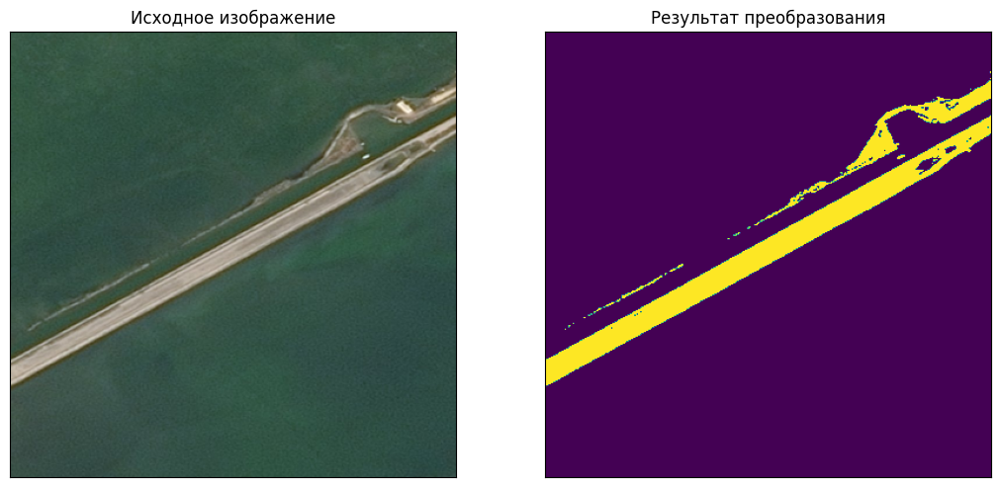

In [ ]:
X = image[..., 0].reshape(-1, 1)
n_clusters = 2
kmeans = sklearn.cluster.KMeans(n_clusters=n_clusters)
kmeans.fit(X)
kmeans.labels_
label_knn = np.reshape(kmeans.labels_, image.shape[:2])
plot_transform_result(image, label_knn[...])

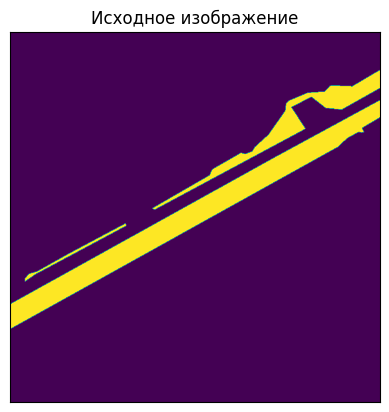

In [ ]:
template = skimage.io.imread('ships/ground_truth/0d5b831d8.png')
template = template[:, :, 0]
plot_one_image(template)

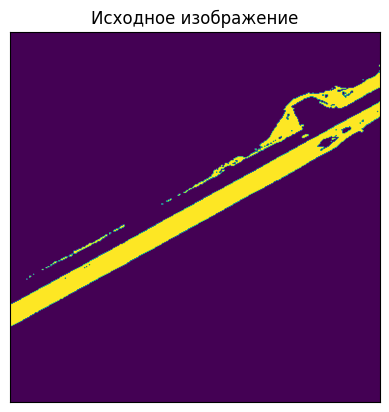

In [ ]:
label_knn = cv2.resize(label_knn, template.shape, interpolation=cv2.INTER_NEAREST)
plot_one_image(label_knn)

In [6]:
def jaccard_score(preds, labels, C, EMPTY=1., ignore=None, per_image=False):
    """
    Array of IoU for each (non ignored) class
    """
    if not per_image:
        preds, labels = (preds,), (labels,)
    ious = []
    for pred, label in zip(preds, labels):
        iou = []
        for i in range(C):
            if i != ignore:
                intersection = ((label == i) & (pred == i)).sum()
                union = ((label == i) | ((pred == i) & (label != ignore))).sum()
                if not union:
                    iou.append(EMPTY)
                else:
                    iou.append(float(intersection) / union)

        ious.append(iou)
    ious = map(np.mean, zip(*ious))
    return np.array(tuple(ious))

In [7]:
def find_mask(image, numb):
    # X = image[..., 0].reshape(-1, 1)
    X = image.reshape(-1, 1)
    n_clusters = numb
    kmeans = sklearn.cluster.KMeans(n_clusters=n_clusters)
    kmeans.fit(X)
    label_knn = np.reshape(kmeans.labels_, image.shape[:2])

    return label_knn

In [ ]:
def lab_temp(filename):
    image = skimage.io.imread(f'ships/img/{filename}.jpg')
    image = skimage.transform.resize(image, tuple(map(int, np.array(image.shape[:2])/2)))

    label_knn = find_mask(image, 2)

    template = skimage.io.imread(f'ships/ground_truth/{filename}.png')
    template = template[:, :, 0]

    label_knn = cv2.resize(label_knn, template.shape, interpolation=cv2.INTER_NEAREST)

    return label_knn, template

In [ ]:
label_knn_s = []
template_s = []

dirname = 'ships/img'
files = [f[:-4] for f in os.listdir(dirname) if os.path.isfile(os.path.join(dirname, f))]

for filename in files:
    label_knn, template = lab_temp(filename)
    label_knn_s.append(label_knn)
    template_s.append(template)

iou = jaccard_score(np.array(label_knn_s), np.array(template_s), C=2, EMPTY=0, per_image=False)

print('Mean IoU:', iou)

Mean IoU: [0.62302395 0.        ]


### Задача №2 - Отделить три класса (треугольник, круг, квадрат) друг от друга

Задача - необходимо реализовать программу, которая делит изображение на три класса : треугольник, круг, квадрат. Сложность состоит в том, что сегментацию нужно выполнить и на зашумленных данных. Все картинки лежат в папке figures/img, разметка к ним - в figures/gt

Для начала попробуем применить алгоритм из Задачи 1 к трем изображениям с разным уровнем зашумленности и посмотрим на результаты

In [54]:
from google.colab import files

uploaded = files.upload()
huge_noise = cv2.imread('huge_noise.png', cv2.IMREAD_GRAYSCALE)

uploaded = files.upload()
little_noise = cv2.imread('little_noise.png', cv2.IMREAD_GRAYSCALE)

uploaded = files.upload()
not_noisy = cv2.imread('not_noisy.png', cv2.IMREAD_GRAYSCALE)

images = [huge_noise, little_noise, not_noisy]

Saving little_noise.png to little_noise (1).png


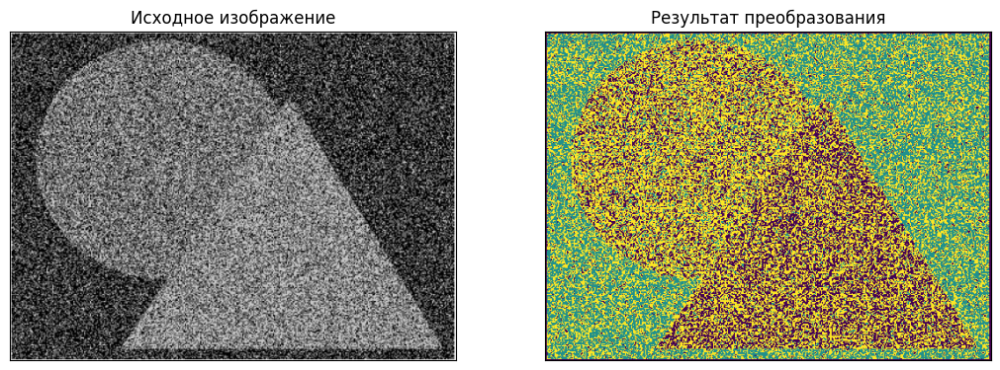

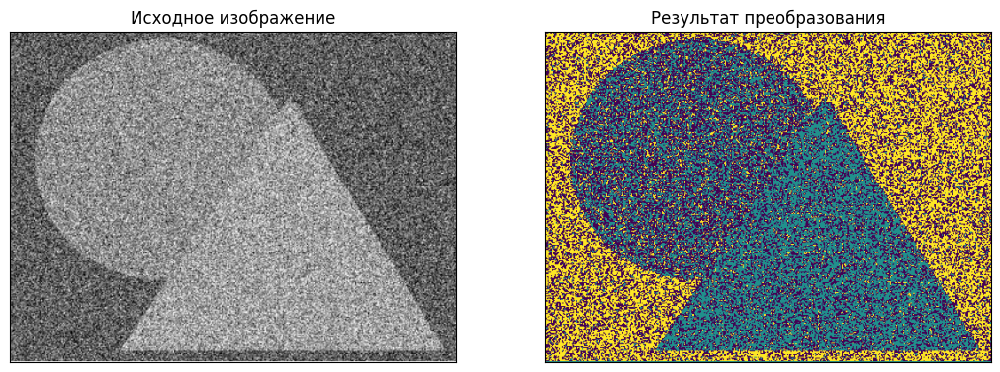

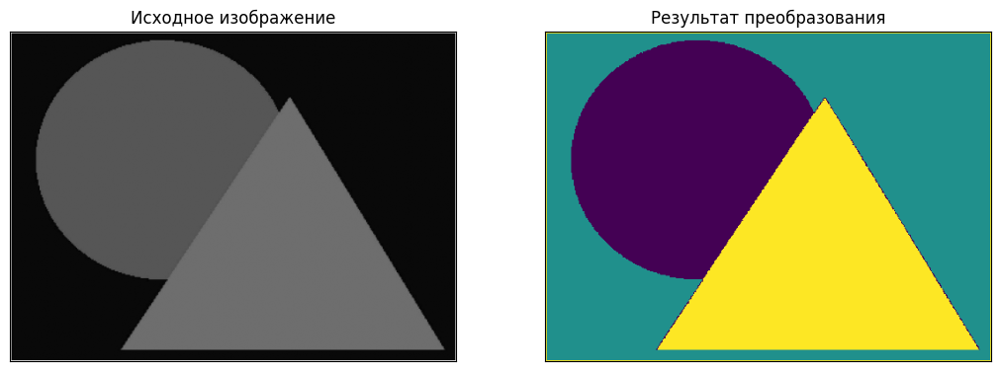

In [6]:
for img in images:
  label_knn = find_mask(img, 3)
  plot_transform_result(img, label_knn, is_gray=True)

Как мы можем увидеть, алгоритм KMeans выполняет сегментацию с приемлемым качеством только на изображении без шума. Это объяснить очень легко:
так как фото у нас черно-белые, параметр у нас один-интенсивность. Алгоритм KMeans объединяет пиксели в кластеры по интенсивности цвета. Но на 1 и 2 изображении присутствует так называемый белый шум, который содержит в себе случайную интенсивность от 0 до 1. Соотвественно, шумовые пиксели алгоритм будет также случайным образом относить к некоторому классу, который ближе по значению интенсивности, но не всегда является истинным.

Можем сделать следующий вывод: обрабработка изображений только алгоритмом KMeans не даст желаемых результатов. Необходима пред- и постобработка.

Исследуем следующий алгоритм:

1) Фильтрация изображения - сглаживаем изобрежение для смягчения шума.
Применим к данным изображением два вида оконных фильров: cv2.GaussianBlur и cv2.medianBlur. Подберем оптимальные параметры и оценим результаты.

2) Применение алгоритма кластеризации KMeans к отфильтрованным изображениям

3) Применение морфологических операций открытия и закрытия для устранения лишних пятен внутри фигур


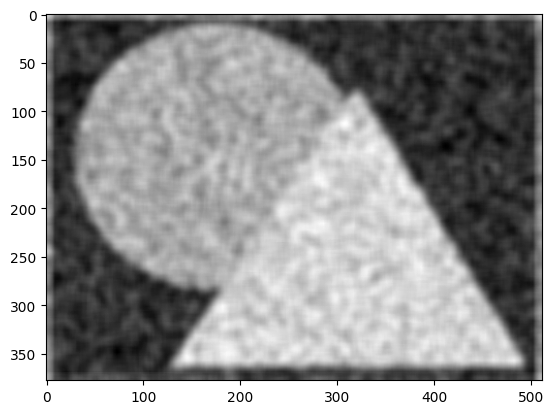

In [ ]:
blured_image = cv2.GaussianBlur(huge_noise, (15, 15), 5)

plt.imshow(blured_image, cmap='gray')

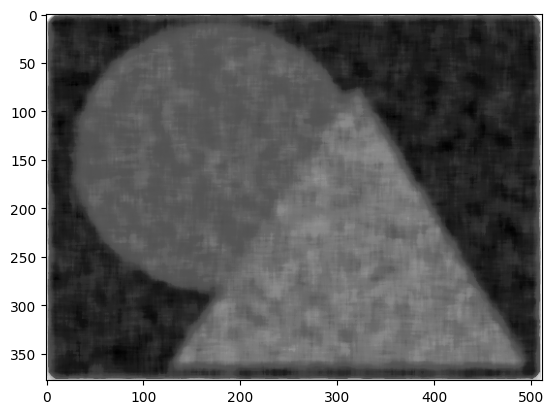

In [ ]:
blured_image = cv2.medianBlur(huge_noise, 15)

plt.imshow(blured_image, cmap='gray')


In [26]:
from matplotlib.colors import ListedColormap

In [15]:
def get_clusters(image, n_clusters=3, blu_ker=15, morph_ker=15, filter=None):

  h, w = image.shape

  if filter == 'Gaussian':
    blurred = cv2.GaussianBlur(image, (blu_ker,blu_ker), 0)
  if filter == 'median':
    blurred = cv2.medianBlur(image, blu_ker)
  else: blurred = image

  pixels = blurred.reshape(-1, 1)

  kmeans = KMeans(n_clusters=n_clusters, random_state=42)
  labels = kmeans.fit_predict(pixels)

  labels_image = labels.reshape(h, w)

  kernel = np.ones((morph_ker,morph_ker), np.uint8)

  closed = cv2.morphologyEx(labels_image.astype(np.uint8), cv2.MORPH_CLOSE, kernel)
  opened = cv2.morphologyEx(closed, cv2.MORPH_OPEN, kernel)

  return blurred, labels_image, closed, opened

In [24]:
def process_plot(image, blurred, labels_image, closed, opened):

  plt.figure(figsize=(30, 15))

  plt.subplot(231), plt.imshow(image, cmap='gray')
  plt.title('Исходное изображение'), plt.axis('off')

  plt.subplot(232), plt.imshow(blurred, cmap='gray')
  plt.title('После сглаживания'), plt.axis('off')

  plt.subplot(233), plt.imshow(labels_image, cmap=custom_cmap)
  plt.title('До морфологических операций'), plt.axis('off')

  plt.subplot(234), plt.imshow(closed, cmap=custom_cmap)
  plt.title('После закрытия'), plt.axis('off')

  plt.subplot(235), plt.imshow(opened, cmap=custom_cmap)
  plt.title('После открытия'), plt.axis('off')

  plt.show()

In [27]:
background = [0, 0, 0]           # Черный фон
circle = [111/255, 136/255, 60/255]  # Цвет круга
triangle = [53/255, 16/255, 233/255] # Цвет треугольника

custom_colors = [background, circle, triangle]

custom_cmap = ListedColormap(custom_colors)

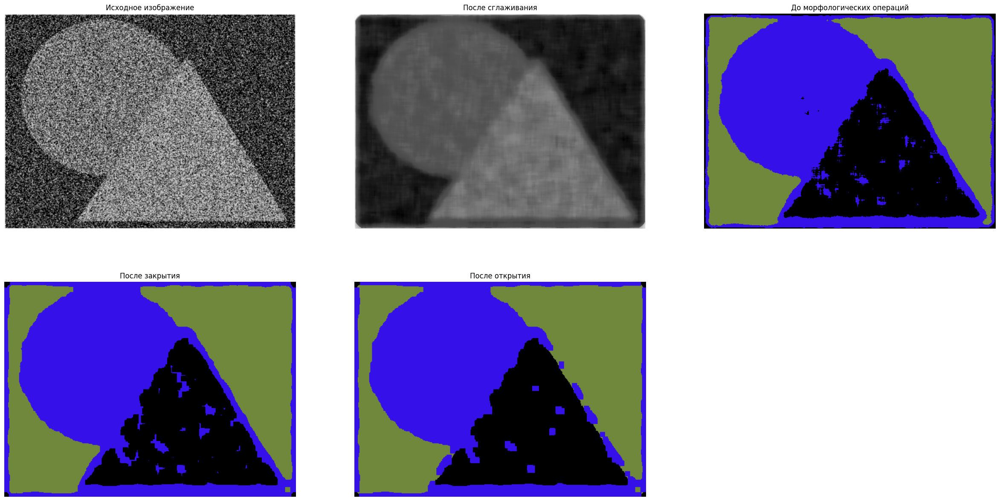

In [ ]:
blurred, labels_image, closed, opened = get_clusters(huge_noise, n_clusters=3, blu_ker=21, morph_ker=9, filter='median')

# print(labels_image.unique())
process_plot(huge_noise, blurred, labels_image, closed, opened)

Как мы видим - фигуры сегментируются уже намного лучше, чем просто с использованием алгоритма кластеризации KMeans.  

Далее найдем оптимальные параметры для нашего алгоритма, на которых мы сможем получить лучшее качество. В качестве метрики будем использовать jaccard_score.

Так как при подсчете метрики мы считаем пересечение/объединение предсказанных и реальных кластеров, нам необходимо знать цвета каждого из них.

Но так как алгорит распределяет цвета случайным образом, было решено поступить так: на предсказанном изображении менять распрелеление цветов между кластерами всеми возможными способами (так как цвета у нас три, у нас таких вариантов 6), и для каждого случая считать метрику. Не попали по цветам - метрика будет очень низкой, попали - высокой(в случае корректной сегментации). Сохраним информацию по каждому возможному варианту в виде [blu_ker,morph_ker,filter,iou].

А далее - отсортируем элементы по значению iou(метрики) и определим лучшие параметры

In [17]:
from google.colab import files

uploaded = files.upload()
template = cv2.imread('huge_noise_t.png')

Saving huge_noise_t.png to huge_noise_t.png


In [7]:
blur_kernels = list(range(5,33,2))
morph_kernels = list(range(5,33,2))
filters = ['Gaussian', 'median']

In [21]:
comutations = [(0,1,2), (0,2,1), (1,0,2), (1,2,0), (2,0,1), (2,1,0)]
ious = []

for blu_ker in blur_kernels:
  for morph_ker in morph_kernels:
    for filter in filters:
      _, _, _, result = get_clusters(huge_noise, n_clusters=3, blu_ker=blu_ker, morph_ker=morph_ker, filter=filter)
      _template = np.zeros((template.shape[0],template.shape[1]))

      for comutation in comutations:
        _template[np.where(template==[0, 0, 0])[:2]] = comutation[0]
        _template[np.where(template==[111, 136, 60])[:2]] = comutation[1]
        _template[np.where(template==[53, 16, 233])[:2]] = comutation[2]

        iou = jaccard_score(np.array(result), np.array(_template), C=3, EMPTY=0, per_image=False)
        ious.append([blu_ker,morph_ker,filter,iou])


In [22]:
sorted_ious = sorted(ious, key=lambda x: np.mean(x[3]), reverse=True)
print(sorted_ious[:3])

[[9, 13, 'median', array([0.94067482, 0.93710876, 0.89982567])], [9, 11, 'median', array([0.92476651, 0.94298337, 0.87730107])], [9, 15, 'median', array([0.92109633, 0.92787037, 0.89395959])]]


Лучшими параметрами для нашего алгоритма оказались: blu_ker=9, morph_ker=13, filter='median'

с качеством iou = [0.94067482, 0.93710876, 0.89982567]

Посмотрим на результат:

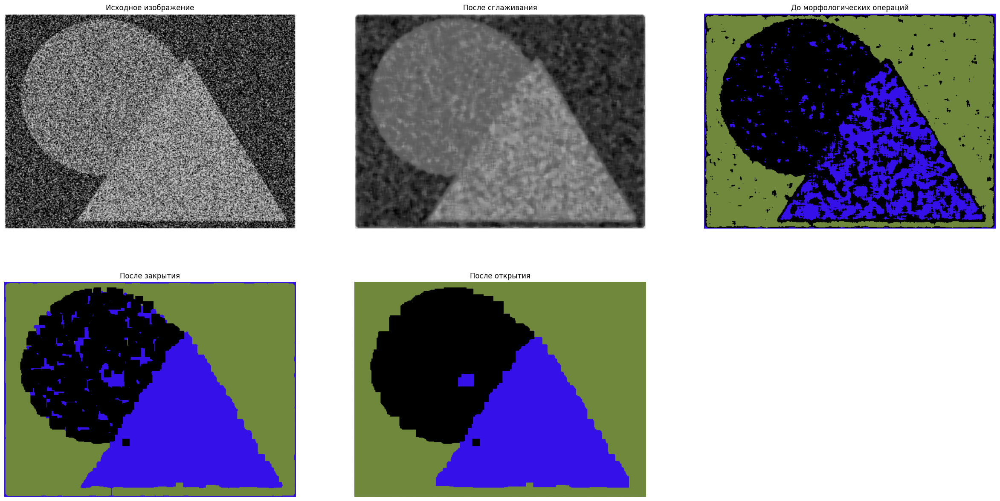

In [28]:
blurred, labels_image, closed, opened = get_clusters(huge_noise, n_clusters=3, blu_ker=9, morph_ker=13, filter='median')

# print(labels_image.unique())
process_plot(huge_noise, blurred, labels_image, closed, opened)

Попробуем также добавить фильтр высоких частот(с целью устранения шумов) и посмотрим на результаты

In [9]:
# Применение FFT для фильтрации высоких частот
def high_pass_filter(image, r=40):
    # Применение FFT
    f = np.fft.fft2(image)
    f_shift = np.fft.fftshift(f)  # Центрирование спектра

    rows, cols = image.shape
    crow, ccol = rows // 2, cols // 2  # Центр изображения
    mask = np.zeros((rows, cols), np.uint8)

    mask[crow - r:crow + r, ccol - r:ccol + r] = 1  # Оставляем только низкие частоты

    f_shift_filtered = f_shift * mask

    f_filtered = np.fft.ifftshift(f_shift_filtered)
    image_filtered = np.fft.ifft2(f_filtered)
    image_filtered = np.abs(image_filtered)  # Получение действительной части

    image_filtered = cv2.normalize(image_filtered, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)

    return image_filtered, f_shift_filtered

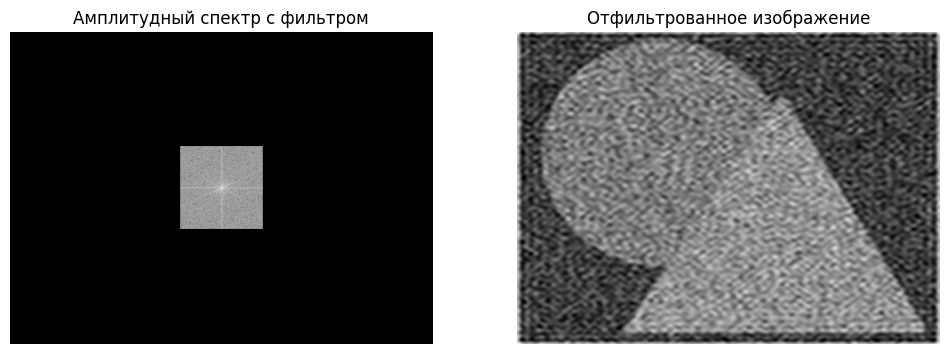

In [11]:
image_filtered, f_shift_filtered = high_pass_filter(huge_noise, r=50)

# Визуализация
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.title('Амплитудный спектр с фильтром')
plt.imshow(np.log(np.abs(f_shift_filtered) + 1), cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Отфильтрованное изображение')
plt.imshow(image_filtered, cmap='gray')
plt.axis('off')

plt.show()

Снова попробуем подобрать оптимальные параметры для нашего алгоритма.

In [12]:
blur_kernels = list(range(5,33,2))
morph_kernels = list(range(5,33,2))
filters = ['Gaussian', 'median']
f_radiuses = list(range(10,60,5))

In [18]:
ious = []

comutations = [(0,1,2), (0,2,1), (1,0,2), (1,2,0), (2,0,1), (2,1,0)]

for blu_ker in blur_kernels:
  for morph_ker in morph_kernels:
    for filter in filters:
      for f_radius in f_radiuses:
        image_filtered, _ = high_pass_filter(huge_noise, r=f_radius)
        _, _, _, result = get_clusters(image_filtered, n_clusters=3, blu_ker=blu_ker, morph_ker=morph_ker, filter=filter)
        _template = np.zeros((template.shape[0],template.shape[1]))

        for comutation in comutations:
          _template[np.where(template==[0, 0, 0])[:2]] = comutation[0]
          _template[np.where(template==[111, 136, 60])[:2]] = comutation[1]
          _template[np.where(template==[53, 16, 233])[:2]] = comutation[2]

          iou = jaccard_score(np.array(result), np.array(_template), C=3, EMPTY=0, per_image=False)
          ious.append([blu_ker,morph_ker,f_radius, filter,iou])

In [19]:
sorted_ious = sorted(ious, key=lambda x: np.mean(x[3]), reverse=True)
print(sorted_ious[:3])

[[9, 9, 'median', array([0.90784996, 0.95036914, 0.89590086])], [9, 11, 'median', array([0.90444637, 0.94292634, 0.90529689])], [9, 9, 'median', array([0.90508518, 0.95061715, 0.89623569])]]


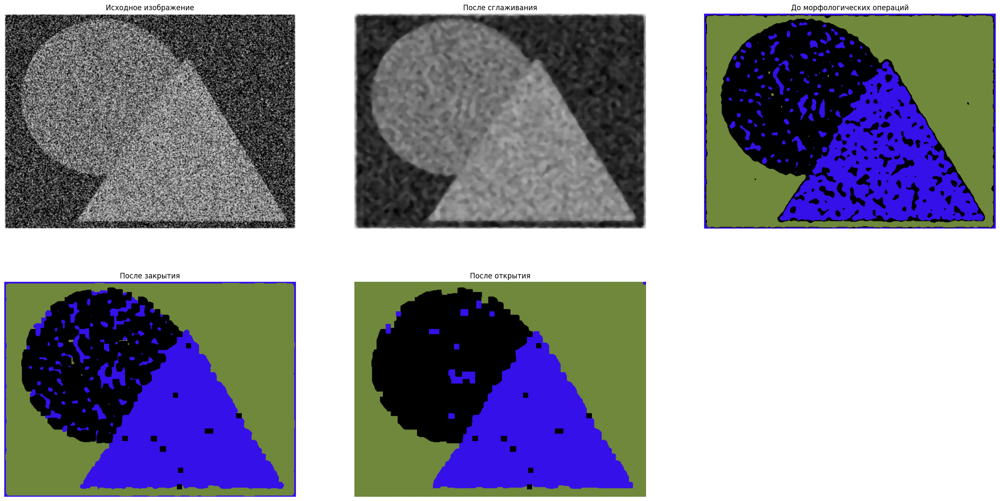

In [32]:
image_filtered, _ = high_pass_filter(huge_noise, r=50)
blurred, labels_image, closed, opened = get_clusters(image_filtered, n_clusters=3, blu_ker=9, morph_ker=9, filter='median')

process_plot(huge_noise, blurred, labels_image, closed, opened)

Применение фильтра частот, к сожалению, не улучшило метрику на данном изображении

## Результат применения алгоритма для других двух изображения с более низким уровнем зашумленности:

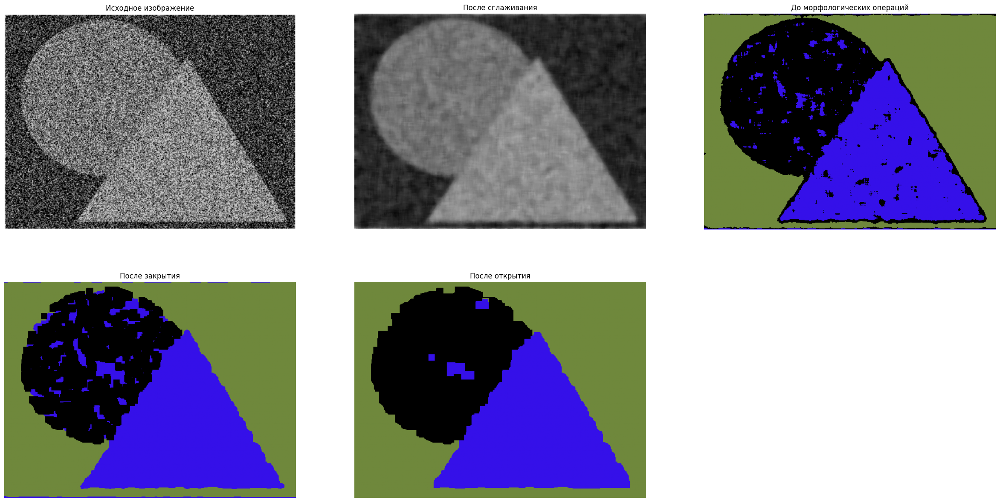

In [58]:
blurred, labels_image, closed, opened = get_clusters(little_noise, n_clusters=3, blu_ker=13, morph_ker=11, filter='median')

process_plot(huge_noise, blurred, labels_image, closed, opened)

## Итог: мы доработали алгоритм KMeans, добавив предварительное сглаживание изображения с применением морфологических операций. Нам удалось значительно улучшить качество сегментации. Мы смогли доработать алгоритм и подобрать параметры так, чтобы алгоритм работал с приемлемой точностью даже на зашумленных изображениях.